In [2]:
import os
import numpy as np
from skimage.transform import rescale, resize

import tensorflow as tf
from tqdm.keras import TqdmCallback
print(tf.__version__)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2.15.0
Num GPUs Available:  1


In [ ]:
# ## We'll always work with images in range [0, 1]
# import numpy as np

# def get_noisy_img(img, sig=30):
#     """
#     Generate a noisy image by adding Gaussian noise to the input image.

#     Parameters:
#     img (numpy.ndarray): Input image with pixel values in the range [0, 1].
#     sig (int or float): Standard deviation of the Gaussian noise, scaled to [0, 255].

#     Returns:
#     numpy.ndarray: Noisy image with pixel values clipped to [0, 1].
#     """
#     sigma = sig / 255.0
#     noise = np.random.normal(scale=sigma, size=img.shape)
#     img_noisy = np.clip(img + noise, 0, 1).astype(np.float32)
#     return img_noisy

# def get_noisy_images_at_levels(img, noise_levels):
#     """
#     Generate noisy images at different noise levels.

#     Parameters:
#     img (numpy.ndarray): Input image with pixel values in the range [0, 1].
#     noise_levels (list of int or float): List of noise levels to apply.

#     Returns:
#     list of numpy.ndarray: List of noisy images corresponding to the given noise levels.
#     """
#     noisy_images = [get_noisy_img(img, sig) for sig in noise_levels]
#     return noisy_images

# def get_inpainted_img(img, mask_size=0.25):
#     """Task 2: Inpaint rectangular zero mask"""
#     mask = np.ones_like(img)[:, :, :1]
#     sx, sy = int(mask_size * img.shape[0]), int(mask_size * img.shape[1])
#     x = np.random.randint(0, img.shape[0] - sx)
#     y = np.random.randint(0, img.shape[1] - sy)
#     mask[x:x + sx, y:y + sy] = 0
#     img_noisy = img * mask
    # return img_noisy, mask

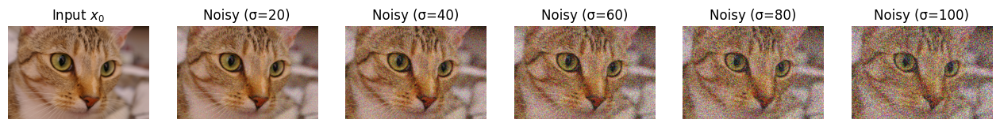

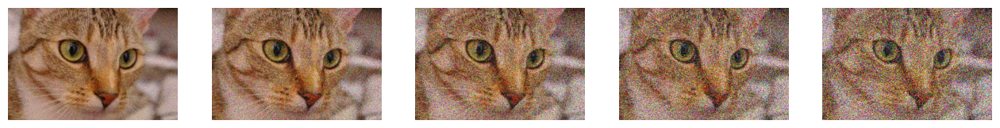

In [3]:
import numpy as np
from skimage import data
from matplotlib import pyplot as plt

imginput=[]

def get_noisy_img(img, sig=30):
    """
    Generate a noisy image by adding Gaussian noise to the input image.

    Parameters:
    img (numpy.ndarray): Input image with pixel values in the range [0, 1].
    sig (int or float): Standard deviation of the Gaussian noise, scaled to [0, 255].

    Returns:
    numpy.ndarray: Noisy image with pixel values clipped to [0, 1].
    """
    sigma = sig / 255.0
    noise = np.random.normal(scale=sigma, size=img.shape)
    img_noisy = np.clip(img + noise, 0, 1).astype(np.float32)
    return img_noisy

def plot_noisy_images(img, noise_levels):
    """
    Plot the original image and its noisy versions at different noise levels.

    Parameters:
    img (numpy.ndarray): Input image with pixel values in the range [0, 1].
    noise_levels (list of int or float): List of noise levels to apply.
    """
    num_levels = len(noise_levels)
    fig, axes = plt.subplots(1, num_levels + 1, figsize=(16, 5))

    axes[0].imshow(img)
    axes[0].set_title("Input $x_0$")
    axes[0].set_axis_off()

    for i, level in enumerate(noise_levels):
        noisy_img = get_noisy_img(img, level)
        imginput.append(noisy_img)
        axes[i + 1].imshow(noisy_img)
        axes[i + 1].set_title(f"Noisy (σ={level})")
        axes[i + 1].set_axis_off()

    plt.show()

# Load example image from skimage and normalize it
img = data.chelsea().astype(np.float32) / 255.0

# Define noise levels (standard deviations)
noise_levels = [20,40, 60,80, 100]

# Plot original and noisy images
plot_noisy_images(img, noise_levels)
fig, axe = plt.subplots(1, 5, figsize=(16, 5))
for i in range(5):
  axe[i].imshow(imginput[i])
  axe[i].set_axis_off()
plt.show()

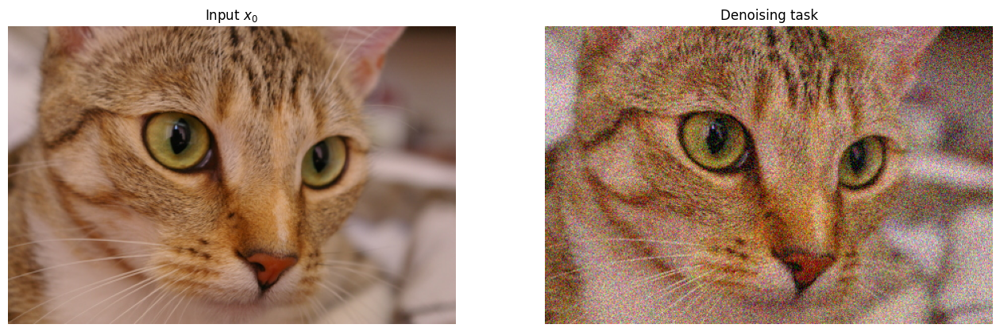

In [4]:
from skimage import data
from matplotlib import pyplot as plt

img = data.chelsea().astype(np.float32) / 255.

_, axis = plt.subplots(1,2, figsize=(16, 5))
axis[0].imshow(img); axis[0].set_title("Input $x_0$")
axis[1].imshow(get_noisy_img(img)); axis[1].set_title("Denoising task")
# axis[2].imshow(get_inpainted_img(img)[0]); axis[2].set_title("Inpainting task")
for ax in axis:
    ax.set_axis_off()
plt.show()

In [5]:
def create_saving_callback(filepath):
    return tf.keras.callbacks.ModelCheckpoint(filepath, save_best_only=True, monitor='loss', mode='min')

def dip_workflow(x0, x_true, f, f_input_shape, z_std=0.1, loss_mask=None, num_iters=5000, init_lr=0.01, save_filepath=None):
    """Deep Image Prior Workflow

    Args:
        x0 (np.array): Input image.
        x_true (np.array): Ground-truth image, used for metrics comparison.
        f (tf.keras.Model): Neural network to use as a prior.
        f_input_shape (tuple): Shape (excluding batch size) of inputs to f.
        z_std (float): Standard deviation for the noise input z.
        loss_mask (np.array): Binary mask for applying loss selectively, used for inpainting.
        num_iters (int): Number of training iterations.
        init_lr (float): Initial learning rate for Adam optimizer.
        save_filepath (str): Filepath to save the best model.
    """

    # Sample input z
    shape = (1,) + f_input_shape
    z = tf.constant(np.random.normal(size=shape).astype(np.float32) * z_std, name='net_input')

    # Training loss
    def loss_fn(y_true, y_pred):
        if loss_mask is None:
            return tf.keras.losses.MeanSquaredError()(y_true, y_pred)
        else:
            return tf.keras.losses.MeanSquaredError()(y_true * loss_mask, y_pred * loss_mask)

    # Metrics for evaluation
    def mse_to_gt(y_true, y_pred):
        return tf.reduce_mean(tf.keras.losses.mean_squared_error(y_true, y_pred))

    def psnr_to_gt(y_true, y_pred, max_val=1.0):
        mse = tf.reduce_mean(tf.keras.losses.mean_squared_error(y_true, y_pred))
        psnr = 10.0 * tf.math.log(max_val ** 2 / mse) / tf.math.log(10.0)
        return psnr

    # Compile model with optimizer and loss function
    opt = tf.keras.optimizers.Adam(learning_rate=init_lr)
    f.compile(optimizer=opt, loss=loss_fn, metrics=[mse_to_gt, psnr_to_gt])

    # Callbacks for saving the best model
    callbacks = []
    if save_filepath is not None:
        callbacks.append(create_saving_callback(save_filepath))

    # Training the model
    history = f.fit(z, x_true[None, ...], epochs=num_iters, steps_per_epoch=1, verbose=0, callbacks=callbacks + [TqdmCallback(verbose=1)])

    # Predict final output
    x = f.predict(z)[0]

    # Plot training dynamics and results
    fig = plt.figure(figsize=(10, 12), constrained_layout=True)
    gs = fig.add_gridspec(3, 2)
    axes = [fig.add_subplot(gs[0, :]), fig.add_subplot(gs[1, 0]), fig.add_subplot(gs[1, 1]), fig.add_subplot(gs[2, 0]), fig.add_subplot(gs[2, 1])]
    for ax in axes[1:]:
        ax.set_axis_off()

    for key in history.history.keys():
        axes[0].plot(range(num_iters), history.history[key], label=key)
    # axes[0].set_yscale('log')
    axes[0].legend()
    axes[0].set_title("Training dynamics")
    axes[1].imshow(x0)
    axes[1].set_title('Input image')
    axes[2].imshow(x_true)
    axes[2].set_title('Ground-truth')
    axes[3].imshow(x)
    axes[3].set_title(f'Last output (PSNR = {psnr_to_gt(x_true, x):.2f})')

    if save_filepath is not None and tf.io.gfile.exists(save_filepath):
        f.load_weights(save_filepath)
        x_opt = f.predict(z)[0]
        axes[4].imshow(x_opt)
        axes[4].set_title(f'Best model output (PSNR = {psnr_to_gt(x_true, x_opt):.2f})')

    plt.show()

    return x,f


In [ ]:
# class GaussianNoiseWithDecay(tf.keras.layers.GaussianNoise):

#     def __init__(self, stddev, decayrate=0.99999, decaysteps=1, **kwargs):
#         super(GaussianNoiseWithDecay, self).__init__(stddev, **kwargs)
#         self.num_calls = 0
#         self.decayrate = decayrate
#         self.decaysteps = decaysteps


#     def call(self, inputs, training=None):
#         def noised():
#             self.num_calls += 1
#             stddev = self.stddev * self.decayrate ** (self.num_calls // self.decaysteps)
#             return inputs + tf.keras.backend.random_normal(
#                 shape=tf.python.ops.array_ops.shape(inputs),
#                 mean=0.,
#                 stddev=stddev,
#                 dtype=inputs.dtype)

#         return tf.keras.backend.in_train_phase(noised, inputs, training=training)

In [6]:
def create_saving_callback(filepath):
    return (tf.keras.callbacks.ModelCheckpoint(
        filepath=filepath,
        monitor='loss',
        verbose=0,
        save_best_only=True,
        mode='min'),)

In [7]:
import tensorflow as tf

# Enable mixed precision training for performance
tf.keras.mixed_precision.set_global_policy('mixed_float16')

def simple_dip_model(input_shape, layers=(128, 128, 128), kernel_size=3):
    def norm_and_active(x):
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.LeakyReLU()(x)
        return x

    inputs = tf.keras.Input(shape=input_shape)

    x = inputs
    for num_filters in layers:
        x = norm_and_active(tf.keras.layers.Conv2D(
            num_filters, kernel_size, strides=1, padding='same')(x))

    x = tf.keras.layers.Conv2D(filters=3, kernel_size=1, strides=1)(x)
    x = tf.keras.layers.Activation('sigmoid', dtype='float32')(x)  # Ensure output is float32

    return tf.keras.Model(inputs=inputs, outputs=x, name="simple_dip_model")

def display_simple_dip_model(input_shape=(256, 256, 3)):
    model = simple_dip_model(input_shape)
    model.build((None,) + input_shape)
    model.summary()

display_simple_dip_model()

Model: "simple_dip_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 128)     3584      
                                                                 
 batch_normalization (Batch  (None, 256, 256, 128)     512       
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 256, 256, 128)     0         
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 128)     147584    
                                                                 
 batch_normalization_1 (Bat  (None, 256, 256, 128)     512       
 chNormalization)                                 

In [8]:
import tensorflow as tf

# Enable mixed precision training for performance
tf.keras.mixed_precision.set_global_policy('mixed_float16')

def conv_block(input_tensor, num_filters, kernel_size=3):
    x = tf.keras.layers.Conv2D(num_filters, kernel_size, padding='same')(input_tensor)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    x = tf.keras.layers.Conv2D(num_filters, kernel_size, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU()(x)
    return x

def encoder_block(input_tensor, num_filters):
    x = conv_block(input_tensor, num_filters)
    p = tf.keras.layers.MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(input_tensor, concat_tensor, num_filters):
    x = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding='same')(input_tensor)
    x = tf.keras.layers.Concatenate()([x, concat_tensor])
    x = conv_block(x, num_filters)
    return x

def unet_model(input_shape):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    enc1, pool1 = encoder_block(inputs, 64)
    enc2, pool2 = encoder_block(pool1, 128)
    enc3, pool3 = encoder_block(pool2, 256)
    enc4, pool4 = encoder_block(pool3, 512)

    # Bottleneck
    bottleneck = conv_block(pool4, 1024)

    # Decoder
    dec4 = decoder_block(bottleneck, enc4, 512)
    dec3 = decoder_block(dec4, enc3, 256)
    dec2 = decoder_block(dec3, enc2, 128)
    dec1 = decoder_block(dec2, enc1, 64)

    outputs = tf.keras.layers.Conv2D(3, (1, 1), activation='sigmoid', dtype='float32')(dec1)  # Ensure output is float32

    return tf.keras.Model(inputs, outputs, name="unet_model")

def display_unet_model(input_shape=(256, 256, 3)):
    model = unet_model(input_shape)
    model.build((None,) + input_shape)
    model.summary()

display_unet_model()


Model: "unet_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_4 (Conv2D)           (None, 256, 256, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 batch_normalization_3 (Bat  (None, 256, 256, 64)         256       ['conv2d_4[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 leaky_re_lu_3 (LeakyReLU)   (None, 256, 256, 64)         0         ['batch_normalization

In [ ]:
# def deep_decoder(input_shape,
#                  noise_reg=None,
#                  layers=(128, 128, 128, 128, 128),
#                  kernel_size=1,
#                  bn_before_act=False,
#                  upsample_first=True):
#     """Deep Decoder.
#        Takes as inputs a 4D Tensor (batch, width, height, channels)"""
#     ## Configure
#     model = tf.keras.models.Sequential(name="Deep Decoder")
#     inputs = tf.keras.Input(shape=input_shape)

#     ## Inputs
#     x = inputs
#     if noise_reg is not None:
#         x = GaussianNoiseWithDecay(**noise_reg)(x)


#     ## Deep Decoder
#     for i, num_filters in enumerate(layers):
#         # Upsample (first)
#         if upsample_first and i != 0:
#             x = tf.keras.layers.UpSampling2D(interpolation='bilinear')(x)

#         # Conv
#         if kernel_size > 1:
#             x = tf.keras.layers.ZeroPadding2D(int((kernel_size - 1) / 2))(x)
#         x = tf.keras.layers.Conv2D(num_filters, kernel_size, strides=1, padding='valid', use_bias=False)(x)

#         # Upsample (second)
#         if not upsample_first and i != len(num_channels_up) - 1:
#             x = tf.keras.layers.UpSampling2D(interpolation='bilinear')(x)

#         # Batch Norm + activation
#         if bn_before_act:
#             x = tf.keras.layers.BatchNormalization(momentum=0.9, epsilon=1e-5)(x)
#         x = tf.keras.layers.ReLU()(x)
#         if not bn_before_act:
#             x = tf.keras.layers.BatchNormalization(momentum=0.9, epsilon=1e-5)(x)

#     # Final convolution
#     x = tf.keras.layers.Conv2D(filters=3, kernel_size=1, strides=1, padding='valid', use_bias=False)(x)
#     x = tf.keras.layers.Activation('sigmoid')(x)
#     return tf.keras.Model(inputs=inputs, outputs=x, name="deep_decoder")


# def display_deep_decoder_model(input_shape=(8, 8, 3)):
#     model = deep_decoder(input_shape)
#     model.build(input_shape)
#     print(model.summary())
# display_deep_decoder_model()

Model: "deep_decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 8, 8, 3)]         0         
                                                                 
 conv2d (Conv2D)             (None, 8, 8, 128)         384       
                                                                 
 re_lu (ReLU)                (None, 8, 8, 128)         0         
                                                                 
 batch_normalization (Batch  (None, 8, 8, 128)         512       
 Normalization)                                                  
                                                                 
 up_sampling2d (UpSampling2  (None, 16, 16, 128)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)      

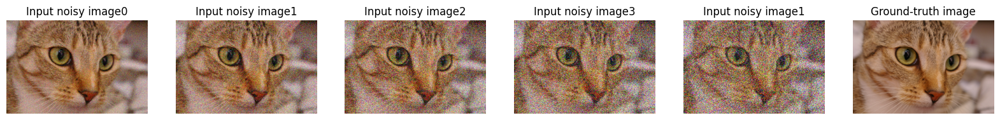

In [9]:
# x_true = resize(data.chelsea().astype(np.float32) / 255., (512, 512))
# x0 = get_noisy_img(x_true)
_, axes = plt.subplots(1, 6, figsize=(20, 4))
axes[0].imshow(imginput[0]); axes[0].set_axis_off()
axes[0].set_title("Input noisy image0")
axes[1].imshow(imginput[1]); axes[1].set_axis_off()
axes[1].set_title("Input noisy image1")
axes[2].imshow(imginput[2]); axes[2].set_axis_off()
axes[2].set_title("Input noisy image2")
axes[3].imshow(imginput[3]); axes[3].set_axis_off()
axes[3].set_title("Input noisy image3")
axes[4].imshow(imginput[4]); axes[4].set_axis_off()
axes[4].set_title("Input noisy image1")
axes[5].imshow(data.chelsea()); axes[5].set_axis_off()
axes[5].set_title("Ground-truth image")
plt.show()

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

1/1 [==============================] - 0s 24ms/step


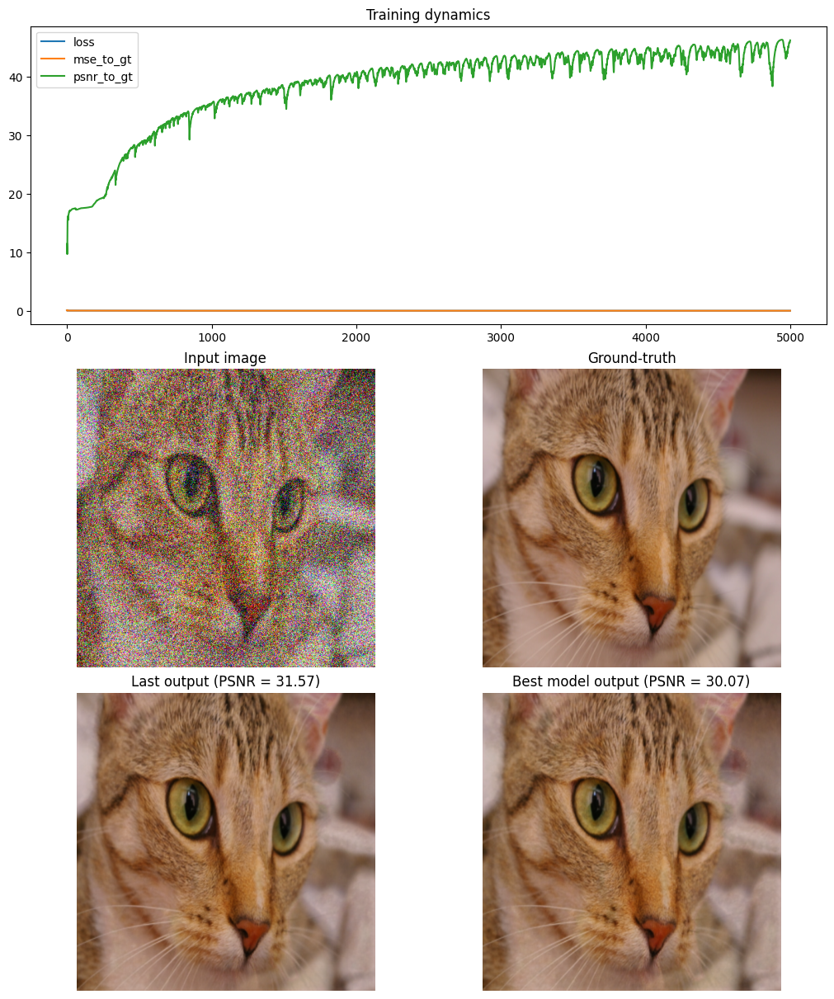

In [12]:
x_true = resize(data.chelsea().astype(np.float32) / 255., (512, 512))
x0 = get_noisy_img(x_true,100)
input_shape = x0.shape
# noise_reg = {'stddev': 1./ 30., 'decayrate': 1.0, 'decaysteps': 100000}

model = unet_model(input_shape)
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=5000, save_filepath='best_dip_denoising.hdf5')
# x0 = get_noisy_img(x_true,80)
# input_shape = x0.shape
# x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=1000, save_filepath='best_dip_denoising.hdf5')
# x0 = get_noisy_img(x_true,60)
# input_shape = x0.shape
# x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=1000, save_filepath='best_dip_denoising.hdf5')
# x0 = get_noisy_img(x_true,40)
# input_shape = x0.shape
# x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=1000, save_filepath='best_dip_denoising.hdf5')
# x0 = get_noisy_img(x_true,20)
# input_shape = x0.shape
# x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=1000, save_filepath='best_dip_denoising.hdf5')
# x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=10, save_filepath='best_dip_denoising.hdf5')

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

1/1 [==============================] - 0s 24ms/step


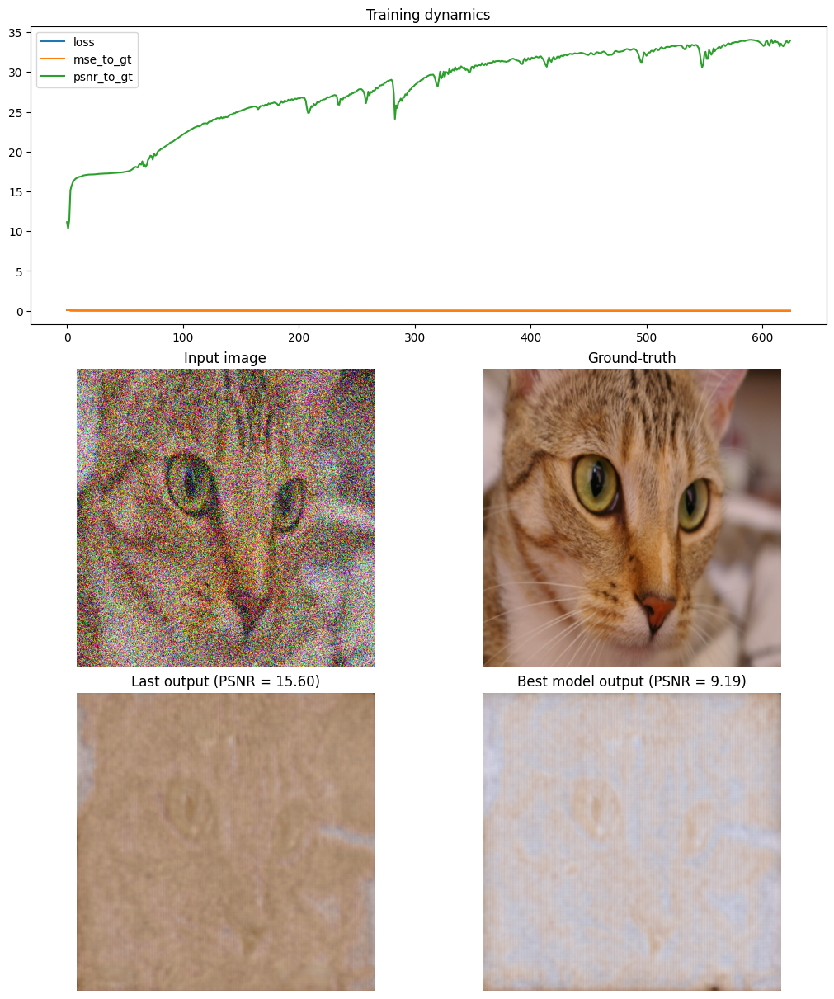

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

1/1 [==============================] - 0s 25ms/step


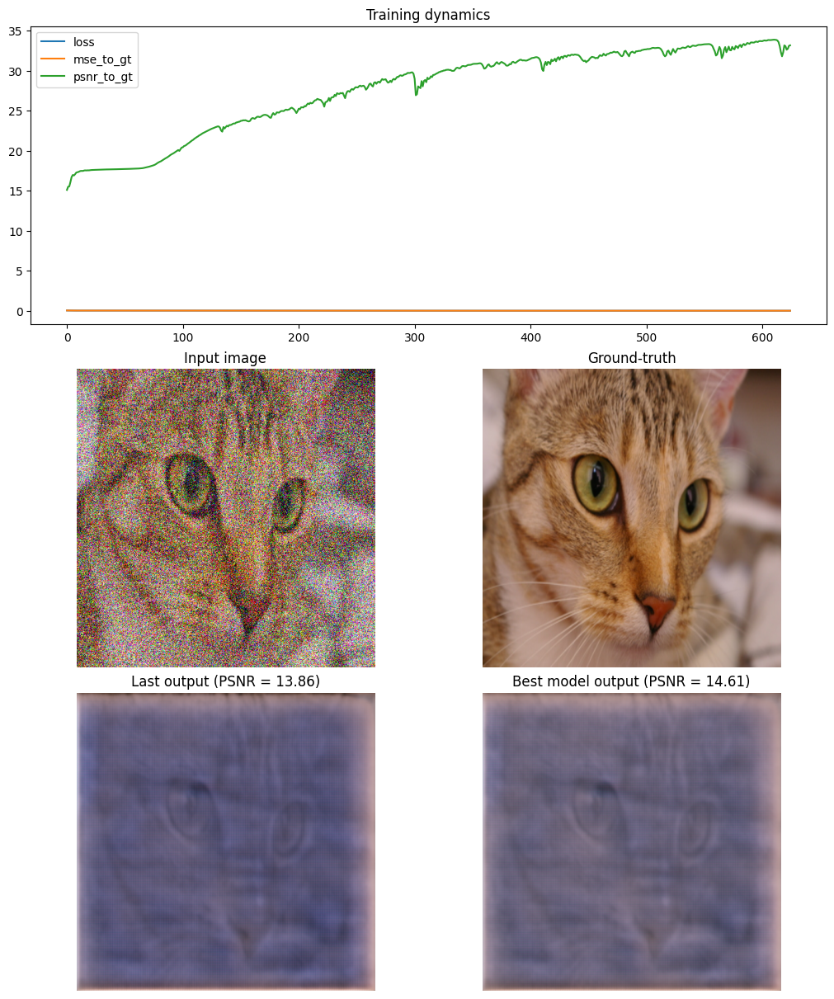

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

1/1 [==============================] - 0s 24ms/step


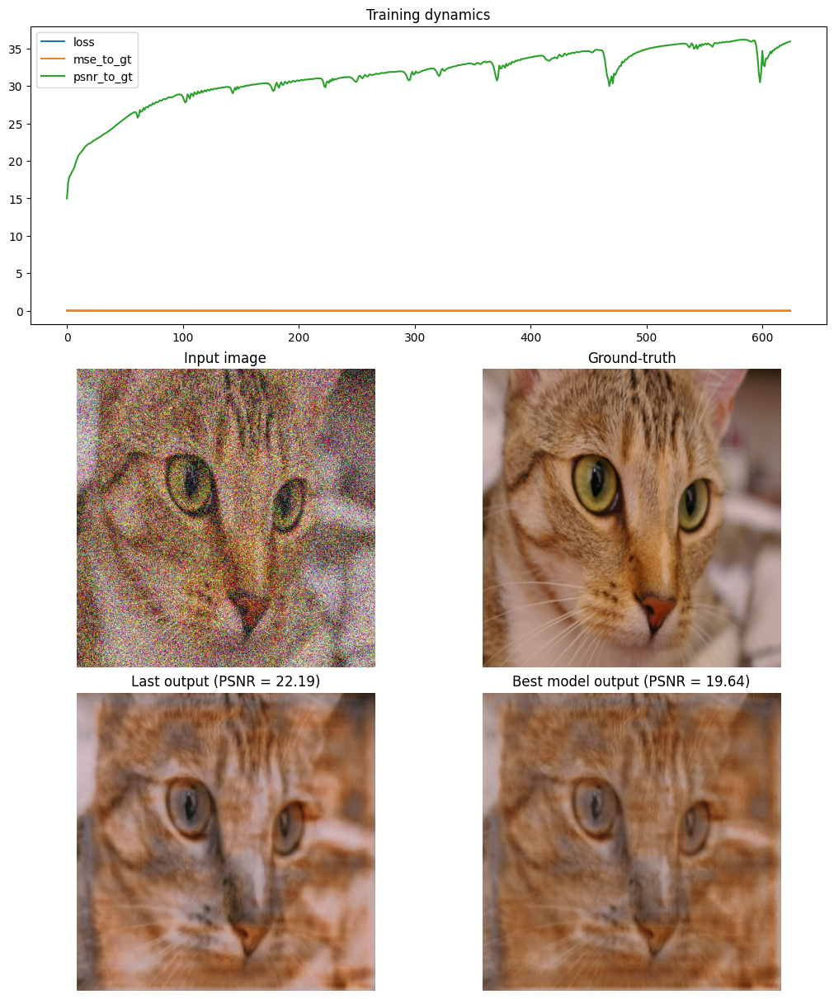

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

1/1 [==============================] - 0s 26ms/step


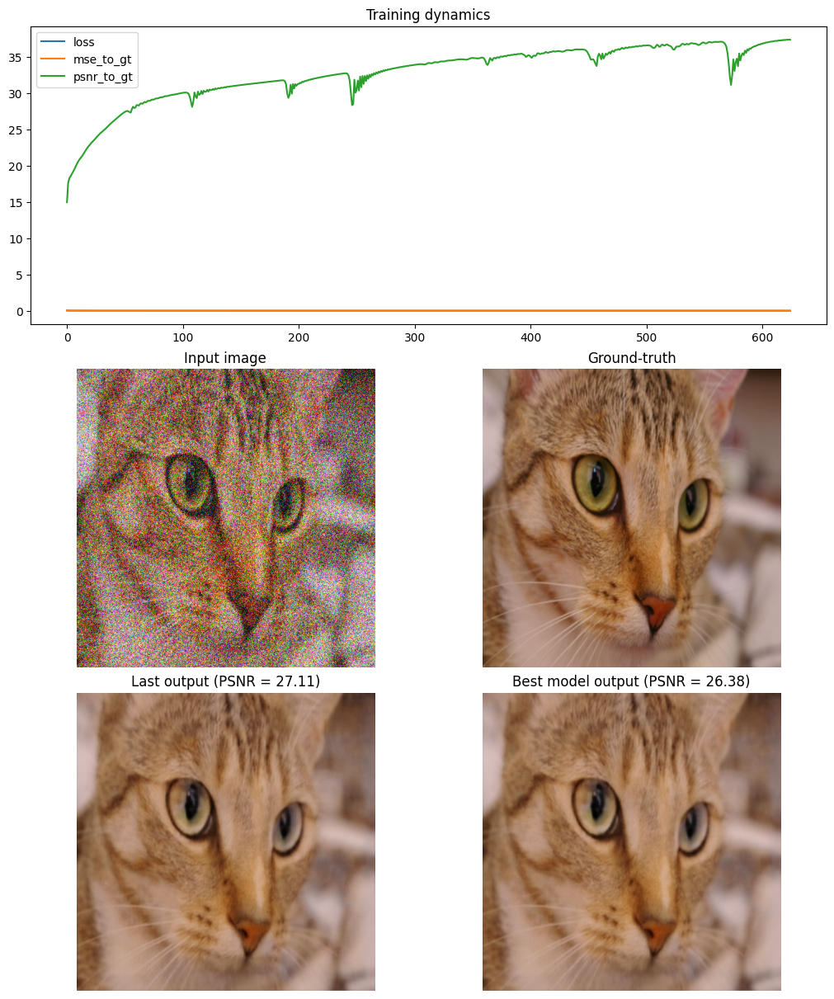

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

In [ ]:
x_true = resize(data.chelsea().astype(np.float32) / 255., (512, 512))
x0 = get_noisy_img(x_true,120)
input_shape = x0.shape
# noise_reg = {'stddev': 1./ 30., 'decayrate': 1.0, 'decaysteps': 100000}

model = unet_model(input_shape)
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')
x0 = get_noisy_img(x_true,105)
input_shape = x0.shape
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')
x0 = get_noisy_img(x_true,90)
input_shape = x0.shape
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')
x0 = get_noisy_img(x_true,75)
input_shape = x0.shape
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')
x0 = get_noisy_img(x_true,60)
input_shape = x0.shape
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')
x0 = get_noisy_img(x_true,45)
input_shape = x0.shape
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')
x0 = get_noisy_img(x_true,30)
input_shape = x0.shape
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')
x0 = get_noisy_img(x_true,15)
input_shape = x0.shape
x,model = dip_workflow(x0, x_true, model, input_shape, num_iters=625, save_filepath='best_dip_denoising.hdf5')

